# Loading and pre-processing

In this first plugin, data can be loaded, visualized and pre-processed, and regions of interest can be selected and masked if necessary.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
import napari
from napari.utils import nbscreenshot
from napari_sediment.sediment_widget import SedimentWidget

In [3]:
viewer = napari.Viewer()
self = SedimentWidget(viewer)
viewer.window.add_dock_widget(self);

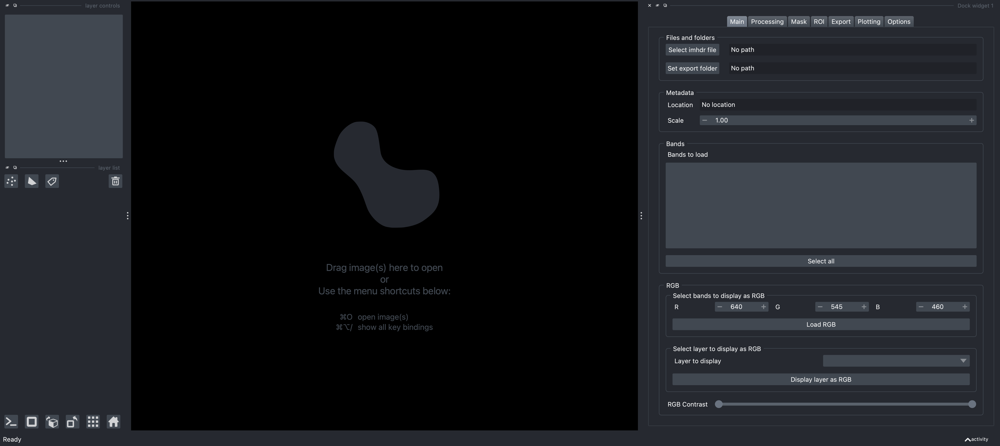

In [4]:
nbscreenshot(viewer)

Above you can see the interface of the pre-processing plugin which is split into multiple parts that we explore here.

## Main

### Files and folders

Here you select which .hdr file to analyze. When a file is selected, the corresponding White and Dark correction images are searched for automatically.

In [5]:
imhdr_path = Path('/Users/gw18g940/Desktop/Test_data/Zahajska/synthetic/Synthetic1/Synthetic1_123/capture/Synthetic1_123.hdr')
self.set_paths(imhdr_path)
self._on_select_file()
viewer.layers['imcube'].visible = False;

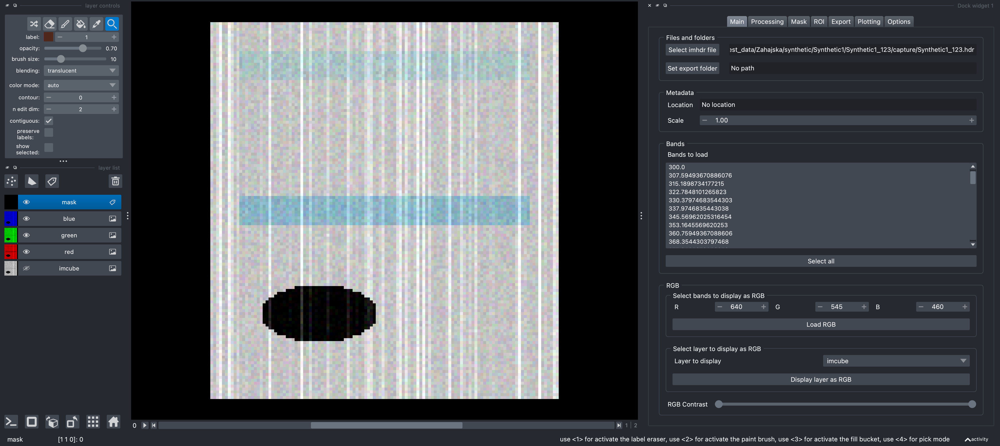

In [6]:
nbscreenshot(viewer)

When a file is selected, a series of layers are added to the viewer. By default only three bands corresponding to RGB wavelengths are loaded. They are loaded as separate "colored" images (green, red. blue layers), as well as a 3D (bands, height, width) data cube called ```imcube```.

### Metadata

When an .hdr file is loaded, it's metadata such as wavelength of each band, are also read. Additional infos such as location of data acquisition and conversion factor from pixel to millimeters can be set manually.

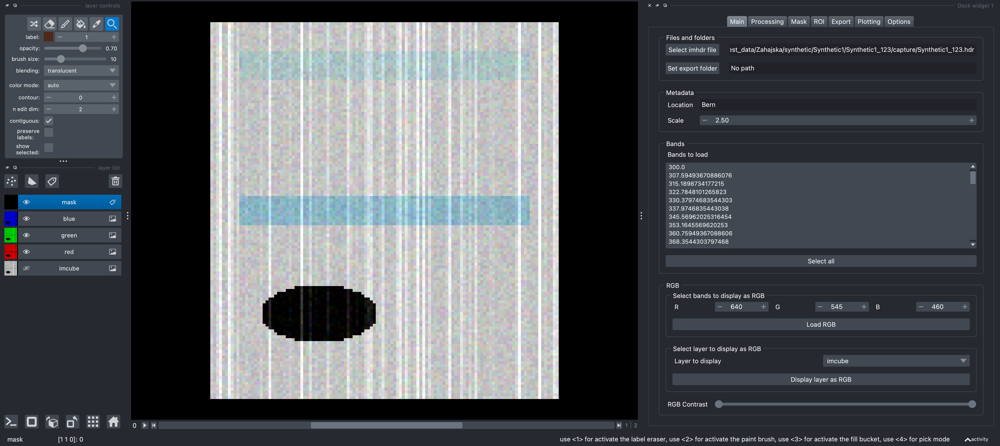

In [7]:
self.metadata_location.setText('Bern')
self.spinbox_metadata_scale.setValue(2.5)
nbscreenshot(viewer)

### Bands

Once a dataset has been loaded, all available bands are displayed in this list. Once can then manually click on bands to be loaded. To select multiple bands, hold the Shift key. The imported bands are stored in the ```imcube``` layer. Beware that for large datasets, it is not recommended to load all bands as this will consume large amounts of memory.

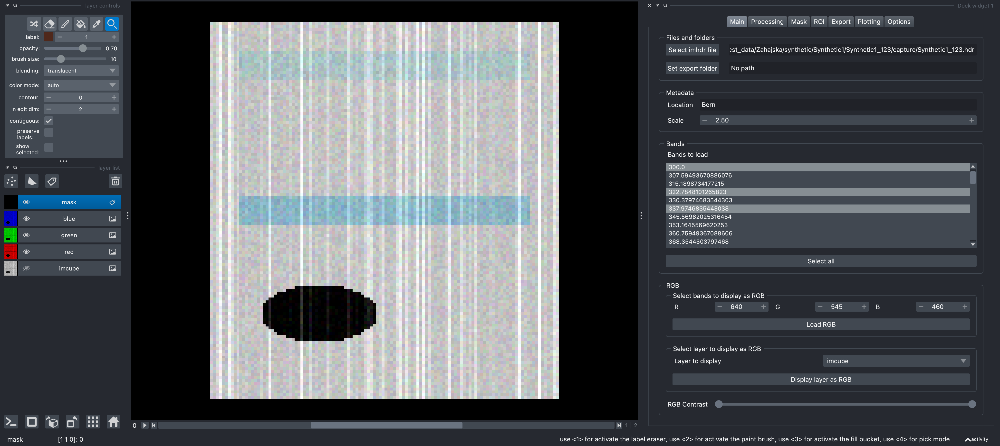

In [8]:
[self.qlist_channels.item(x).setSelected(True) for x in [0,3,5]]
nbscreenshot(viewer)

### RGB

The RGB section allows you to control which bands are displayed as RGB. There are two ways to change the displayed RGB layers:

1. You can pick the wavelengths to be used for RGB using the three adjustable numbers. The closest wavelengths are selected in the list of actual wavelengths when ```Load RGB``` is pressed and the RGB layers updated. Those bands are now selected and also appear in the ```imcube``` data.

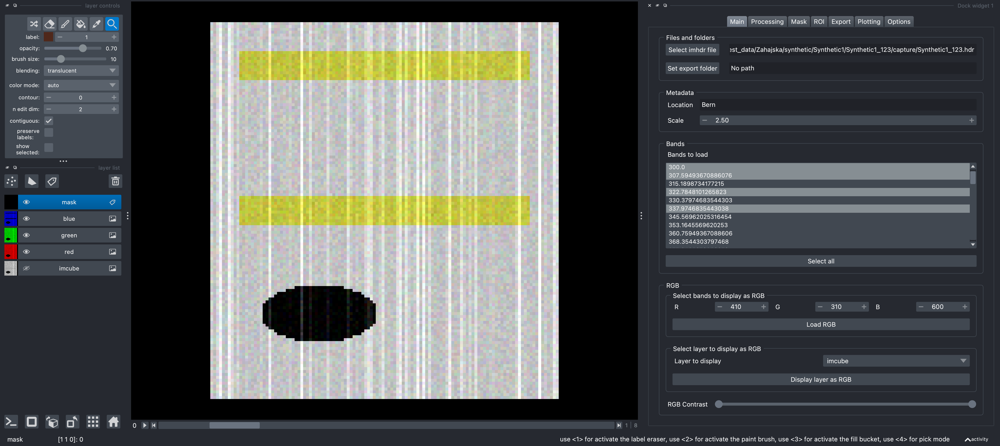

In [9]:
self.rgb_widget.spin_rchannel.setValue(410)
self.rgb_widget.spin_gchannel.setValue(310)
self.rgb_widget.spin_bchannel.setValue(600)
self.rgb_widget._on_click_RGB()
nbscreenshot(viewer)

2. Multidimensional layers such as ```imcube``` can also be displayed as RGB. Of course in that case if more than three channels are present, only the three first ones are used. The main application of this mechanism is to check pre-processing quality. In that case, only RGB wavelengths are loaded, then corrected (see below) and then the corrected data can be displayed as RGB.

Finally, the RGB contrast slider allows to adjust the contrast of all three RGB layers together.

## Processing

In the processing tab, one can perform background correction as well as destriping. Note that while background correction is necessary, destriping should not be used for quantitative measurements but only to display images.

### Background correction

Here one can see which reference files are used for background correction. If none have been found or the wrong ones are selected, they can be chosen manually with the ```Manual selection``` buttons.

When pressing ```Correct imcube``` background correction is applied to the data loaded in ```imcube``` and a new layers called ```imcube_corrected``` containing the corrected data is created.

In [10]:
self.tabs.setCurrentIndex(1)
self._on_click_background_correct()

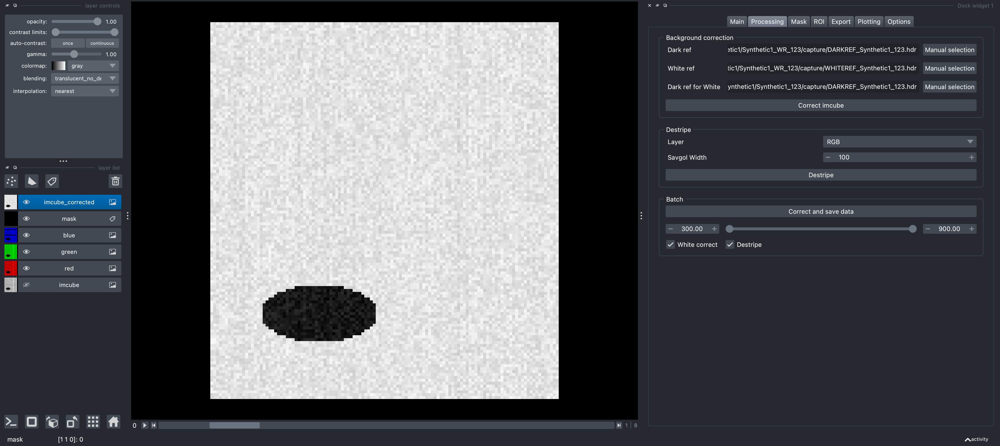

In [11]:
nbscreenshot(viewer)

### destriping

Destriping is performed using a Savgol filter (local fit of each scan line to remove outliers). The size of the region to fit is set using the ```Savgol Width```. Note that here you can choose which layer to destripe: ```imcube``` directly (i.e. without background correction) or ```imcube_corrected```. This generates another layer called ```imcube_destripe```.

In [12]:
self._on_click_destripe()

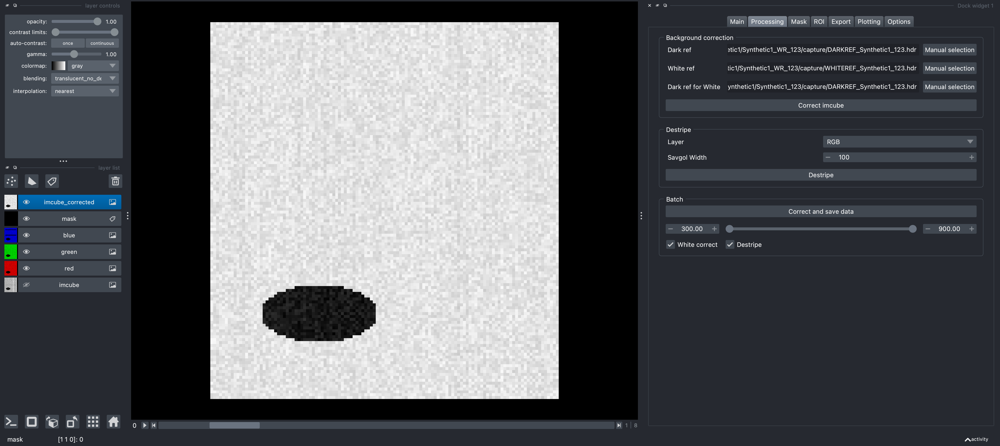

In [13]:
nbscreenshot(viewer)

### Batch

In this last group of functions you can apply correction to the full dataset without the need to load it in the viewer (which is usually impossible because of its size). You can choose which correction to apply (destripe is always applied after white correction if both a re selected). You can also limit to bands to process. Data are saved in zarr format with the name ```corrected.zarr```.

## Mask

Unwanted regions can be annotated in a label layer. This can be done manually, directly in the ```mask``` layer.

###  1. Create one ore more masks
A series of (Semi-)Automated methods are also available for this task.

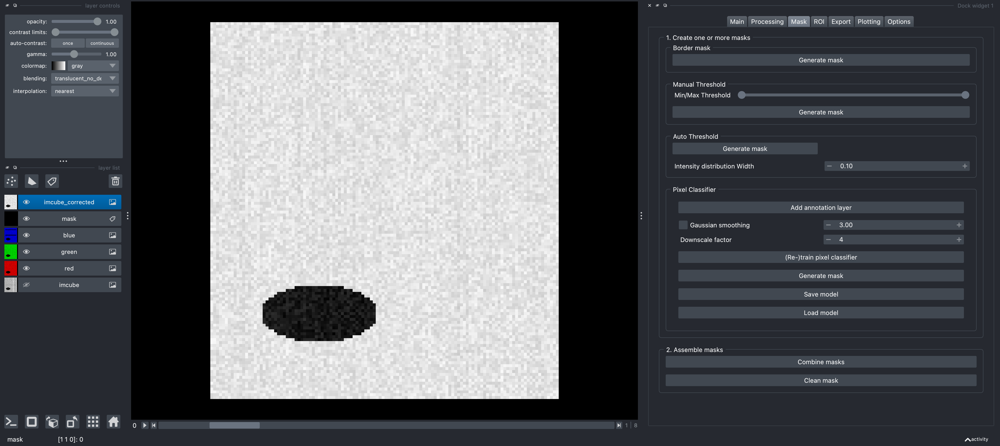

In [14]:
self.tabs.setCurrentIndex(2)
nbscreenshot(viewer)

- Border mask will detect rough borers around the image and try to mask them. This generates a layer called ```masked_border```
- Manual threshold: using the slider a minimum and maximum threshold can be applied on the average intensity of the RGB data.
- Automated threshold: here the values of the min and max threshold are computed automatically by fitting the average RGB intensity distribution with a Gaussian, and removing pixels beyond a certain width that can be adjusted
- Pixel classifier: here a classifier is trained based on a few annotated streaks on the image.

#### Pixel classifier

To be able to do the annotation, one needs first to press on ```Add annotation layer```. In the added labels layer, one can paint background regions with 1 and foreground regions with 2:

In [15]:
self.mlwidget._on_click_add_annotation_layer()

In [16]:
self.viewer.layers['annotations'].data[45:50, 25:35] = 2
self.viewer.layers['annotations'].data[100:105, 23:29] = 1
self.viewer.layers['annotations'].refresh()

In [17]:
self.mlwidget.spin_downscale.setValue(1)
self.mlwidget._on_initialize_model()
self.mlwidget._on_click_ml_mask()

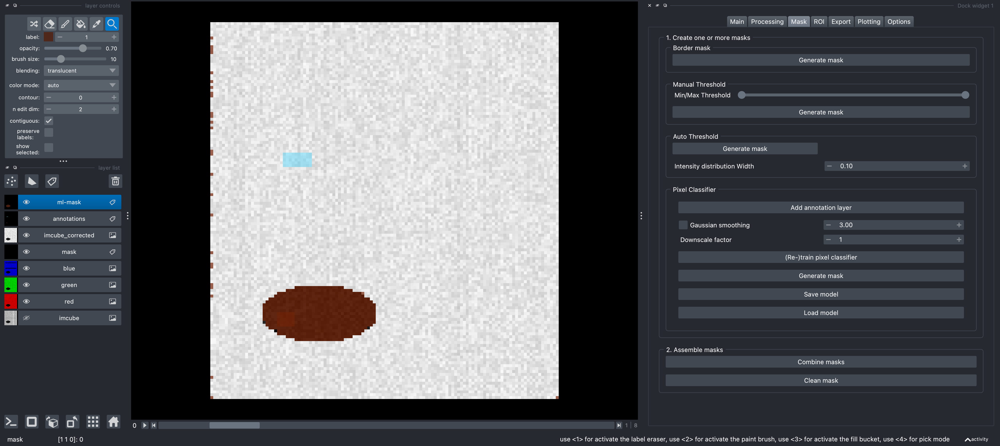

In [18]:
nbscreenshot(viewer)

Then one can train the model using ```Reset/Initialize ML model``` and create a mask with ```Generate mask```. If the result is not satisfactory, one can add more annotations, retrain and re-generate the mask.

### 2. Assemble

As potentially multiple masks were generated, e.g. one to exclude borders, one with a threshold, those need to be combined in a single mask. This can be done using ```Combine masks```. Finally the mask can be cleaned by closing holes in the mask using ```Clean mask```.

In [19]:
self._on_click_combine_masks()

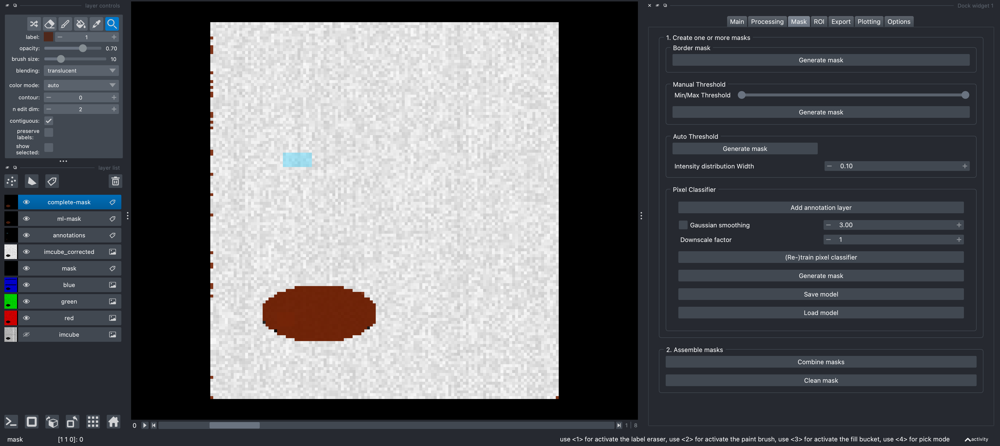

In [20]:
nbscreenshot(viewer)

## ROI

In the ROI tab one can set the regions of interest to analyze. The main ROI is defined as the largest box that contains lines which are not fully masked.

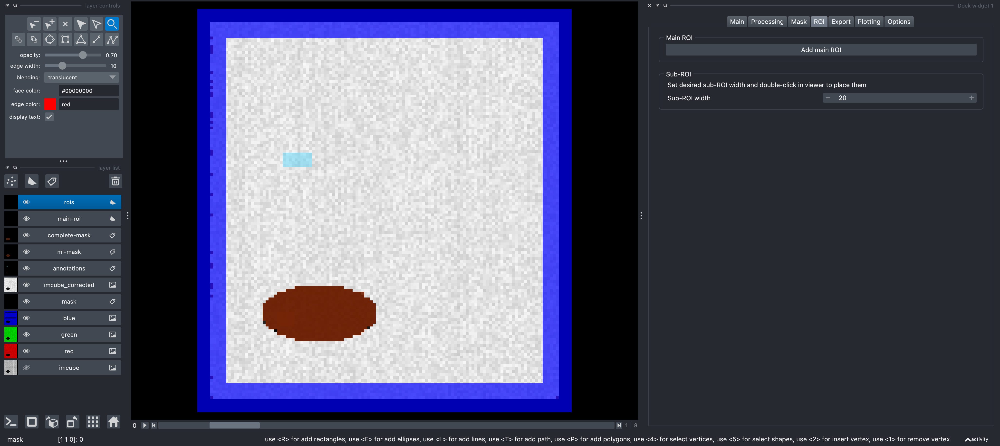

In [21]:
self.tabs.setCurrentIndex(3)
self._on_click_add_main_roi()
nbscreenshot(viewer)

Then single regions of interest can be added in the ```rois``` layer. One can either do that manually using the box annotator or by double-clicking on the image. This adds a roi with a width that can be adjusted in ```Sub-ROI width```.

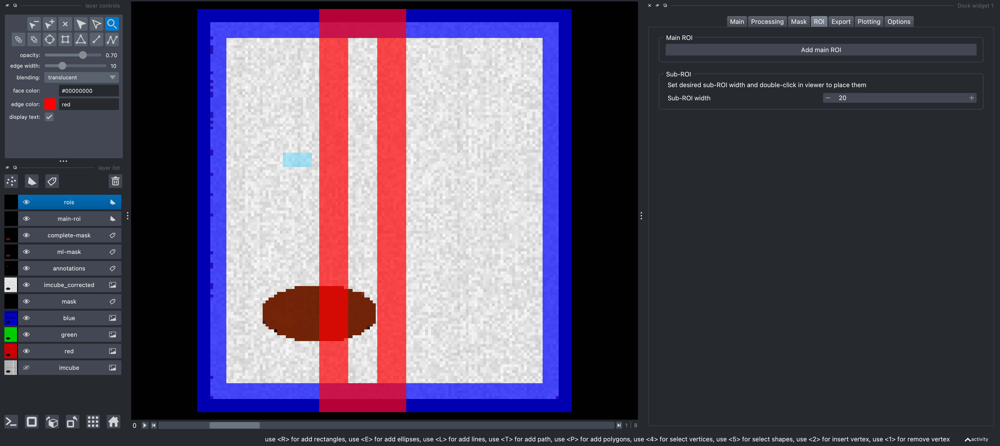

In [23]:
self._add_analysis_roi(cursor_pos=[0,0,52,0])
nbscreenshot(viewer)

## Export

Finally when all the work is done, one needs to save all the infos, including e.g. metadata, masks, rois etc. This can be done using the ```Export Project```. If an export folder has been set in the Main tab, that location will be used, otherwise a new one should be selected. That saved project can later on be reimported as well. It is also possible to export/import just the masks.

Finally, as snapshot of the current viewer can be taken, or the current RGB image exported in high resolution.-

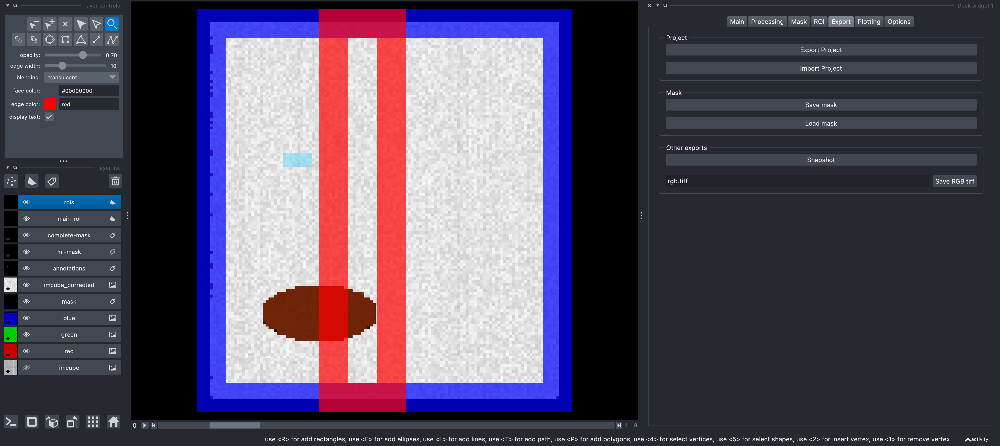

In [24]:
self.tabs.setCurrentIndex(4)
nbscreenshot(viewer)